# 🔁 Inférence et Détection d'Anomalies – Audio DCASE 2024

Ce notebook applique le modèle autoencodeur déjà entraîné pour détecter des sons anormaux :

- Chargement des fichiers audio `.npy` de test
- Extraction et normalisation des features
- Reconstruction via autoencodeur
- Calcul de l’erreur MSE + décision via seuil

📌 Nécessite :
- `autoencoder_model.h5`
- `scaler.pkl`
- `threshold.npy`


In [1]:
# 📌 Librairies standards
import sys
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

# 🤖 Deep Learning
from tensorflow.keras.models import load_model

# 📌 Configuration globale
import warnings
warnings.filterwarnings('ignore')

# 📂 Ajout dynamique du répertoire principal au PYTHONPATH
project_root = Path.cwd().parent  # DCASE2024_ASD_Project/
sys.path.append(str(project_root))

# 🔧 Projet
from src import config, processing
from src.utils.logger_utils import logger


In [2]:
# Chargement
autoencoder = load_model(config.MODEL_PATH)
scaler = joblib.load(config.SCALER_PATH)
threshold = np.load(config.THRESHOLD_PATH)

logger.info("✅ Modèle, scaler et seuil chargés avec succès.")


2025-03-22 22:02:53 - INFO - ✅ Modèle, scaler et seuil chargés avec succès.


## 📂 Chargement des fichiers audio à évaluer

Ce bloc permet de charger les signaux `.npy`, d'extraire les features et de préparer les entrées pour l'inférence.


In [3]:
# Exemple : charger les sons de test d'une machine
machine = "pump"
test_dir = config.NUMPY_AUDIO_DIR / machine / "test"

# Charger les fichiers .npy
test_files = sorted(test_dir.glob("*.npy"))

# Extraction des features + noms
features_list = []
filenames = []

for file_path in test_files:
    signal = np.load(file_path)
    features = processing.extract_features(
        audio_data=signal,
        sr=config.SR,
        hop_length=config.HOP_LENGTH,
        n_mels=config.N_MELS,
        n_fft=config.N_FFT,
        n_mfcc=config.N_MFCC
    )
    mean_features = features.mean(axis=1)  # 1 vecteur
    features_list.append(mean_features)
    filenames.append(file_path.name)

# Matrice (n_samples, n_features)
X_test = np.array(features_list)
logger.info(f"✅ {X_test.shape[0]} fichiers traités pour prédiction")


2025-03-22 22:03:58 - INFO - ✅ 856 fichiers traités pour prédiction


## 📈 Bloc 2 – Inférence et Détection des Anomalies

Ce bloc applique l’autoencodeur aux features test :

- Les vecteurs sont normalisés avec le scaler d’entraînement
- Le modèle tente de reconstruire les vecteurs
- L’erreur de reconstruction (MSE) est calculée
- Une prédiction binaire est obtenue via un seuil défini (normal vs anomaly)


In [4]:
# Normalisation avec le scaler entraîné
X_test_scaled = scaler.transform(X_test)

# Reconstruction avec autoencodeur
X_recon = autoencoder.predict(X_test_scaled)

# Calcul des erreurs de reconstruction
reconstruction_error = np.mean((X_test_scaled - X_recon) ** 2, axis=1)

# Prédiction binaire selon seuil
y_pred = (reconstruction_error > threshold).astype(int)


27/27 [==============================] - 0s 2ms/step


## 📄 Bloc 3 – Visualisation et Export des Résultats

Nous affichons :
- La distribution des erreurs de reconstruction
- Le seuil utilisé pour la classification
- Les résultats sous forme de DataFrame
- L’export CSV pour reporting ou évaluation DCASE-like


,filename,reconstruction_error,predicted_label
0,anomaly_id_00_00000000.npy,0.133446,0
1,anomaly_id_00_00000001.npy,0.128259,0
2,anomaly_id_00_00000002.npy,0.182815,0
3,anomaly_id_00_00000003.npy,0.189951,0
4,anomaly_id_00_00000004.npy,0.167087,0


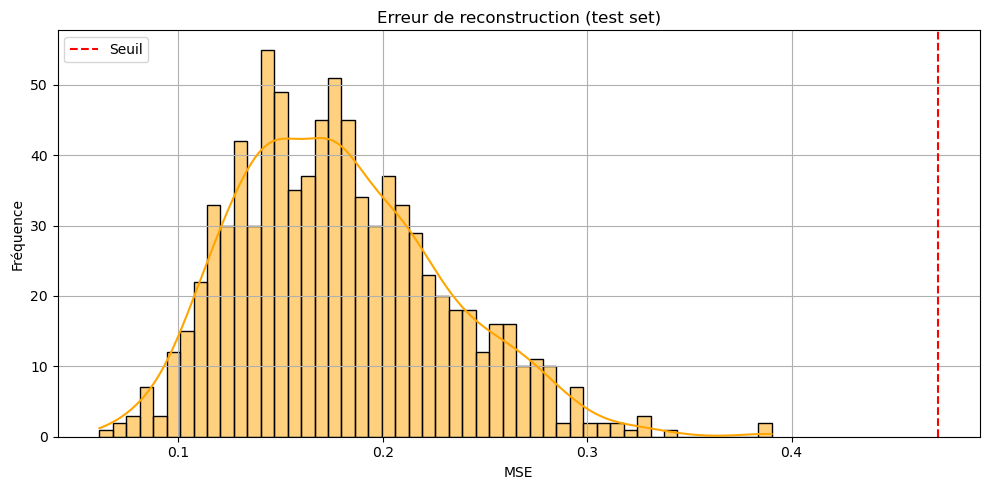

2025-03-22 22:03:59 - INFO - ✅ Résultats exportés : C:\Users\guidy\Documents\Datascience\Projet\Kaggle\DCASE2024_ASD_Project\data\outputs\predictions\reconstruction_predictions.csv


In [5]:
# Résultat sous forme de DataFrame
df_result = pd.DataFrame({
    "filename": filenames,
    "reconstruction_error": reconstruction_error,
    "predicted_label": y_pred
})

# Affichage
display(df_result.head())

# Visualisation
plt.figure(figsize=(10, 5))
sns.histplot(reconstruction_error, bins=50, kde=True, color="orange")
plt.axvline(threshold, color="red", linestyle="--", label="Seuil")
plt.title("Erreur de reconstruction (test set)")
plt.xlabel("MSE")
plt.ylabel("Fréquence")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Export CSV
df_result.to_csv(config.PREDICTIONS_FILE, index=False)
logger.info(f"✅ Résultats exportés : {config.PREDICTIONS_FILE}")


## 🧩 Bloc 4 – Inférence sur plusieurs machines

Ce bloc applique l’autoencodeur sur l’ensemble des machines du jeu de test (`NUMPY_AUDIO_DIR/*/test/*.npy`).

Il extrait les features pour chaque fichier `.npy`, puis :
- Normalise
- Reconstruit
- Calcule l’erreur MSE
- Prédit le label (normal / anomalie)


In [6]:
from tqdm import tqdm

# 📂 Chemin test : NUMPY_AUDIO_DIR / machine_type / test
all_test_files = list((config.NUMPY_AUDIO_DIR).glob("*/*/*.npy"))

# 📦 Initialisation
all_features = []
all_filenames = []
all_machine_types = []

for file_path in tqdm(all_test_files, desc="Extraction multi-machines"):
    try:
        signal = np.load(file_path)
        features = processing.extract_features(
            audio_data=signal,
            sr=config.SR,
            hop_length=config.HOP_LENGTH,
            n_mels=config.N_MELS,
            n_fft=config.N_FFT,
            n_mfcc=config.N_MFCC
        )
        features_mean = features.mean(axis=1)
        all_features.append(features_mean)
        all_filenames.append(file_path.name)
        all_machine_types.append(file_path.parent.parent.name)  # e.g. "pump", "fan"
    except Exception as e:
        logger.warning(f"⚠️ Erreur fichier {file_path.name} : {e}")

# 📐 Conversion en array
X_all = np.array(all_features)


Extraction multi-machines: 100%|█████████████████████████████████████████████████| 30987/30987 [33:09<00:00, 15.58it/s]


In [7]:
# 🔧 Normalisation avec scaler entraîné
X_all_scaled = scaler.transform(X_all)

# 🔁 Reconstruction
X_all_recon = autoencoder.predict(X_all_scaled)
reconstruction_error_all = np.mean((X_all_scaled - X_all_recon)**2, axis=1)

# 🔍 Prédiction binaire
y_pred_all = (reconstruction_error_all > threshold).astype(int)


969/969 [==============================] - 1s 1ms/step


In [8]:
df_multi = pd.DataFrame({
    "filename": all_filenames,
    "machine_type": all_machine_types,
    "reconstruction_error": reconstruction_error_all,
    "predicted_label": y_pred_all
})

# Export CSV global
multi_csv = config.PREDICTIONS_DIR / "multi_machine_predictions.csv"
df_multi.to_csv(multi_csv, index=False)

logger.info(f"📁 Résultats multi-machines exportés dans : {multi_csv}")
display(df_multi.head())


2025-03-22 22:37:10 - INFO - 📁 Résultats multi-machines exportés dans : C:\Users\guidy\Documents\Datascience\Projet\Kaggle\DCASE2024_ASD_Project\data\outputs\predictions\multi_machine_predictions.csv


,filename,machine_type,reconstruction_error,predicted_label
0,anomaly_id_00_00000000.npy,fan,0.120979,0
1,anomaly_id_00_00000001.npy,fan,0.200101,0
2,anomaly_id_00_00000002.npy,fan,0.140930,0
3,anomaly_id_00_00000003.npy,fan,0.183820,0
4,anomaly_id_00_00000004.npy,fan,0.183470,0


## 📊 Bloc 5 – Visualisation dynamique par machine / score / prédiction

Ce graphique permet :
- d’évaluer l’alignement des erreurs de reconstruction entre machines
- de détecter des clusters anormaux spécifiques à un type de machine


In [9]:
import plotly.express as px

fig = px.scatter(
    df_multi,
    x="filename",
    y="reconstruction_error",
    color="machine_type",
    symbol="predicted_label",
    title="Erreur de reconstruction par machine (avec prédictions)",
    labels={"reconstruction_error": "Erreur MSE", "predicted_label": "Label prédit"},
    height=600
)
fig.update_traces(marker=dict(size=7), selector=dict(mode='markers'))
fig.update_layout(xaxis_title="Fichier", yaxis_title="Erreur de reconstruction")
fig.show()


## 📁 Génération du Fichier CSV – Format Challenge

Nous exportons les résultats de prédiction par fichier avec les colonnes :
- `filename`
- `machine_type`
- `reconstruction_error`
- `predicted_label`


In [10]:
# 📄 Format standard : 1 ligne par fichier audio
df_challenge = df_multi[[
    "filename",
    "machine_type",
    "reconstruction_error",
    "predicted_label"
]]

# 🔽 Export CSV format challenge
challenge_path = config.PREDICTIONS_DIR / "challenge_predictions.csv"
df_challenge.to_csv(challenge_path, index=False)

logger.info(f"📁 Fichier challenge exporté : {challenge_path}")


2025-03-22 22:37:13 - INFO - 📁 Fichier challenge exporté : C:\Users\guidy\Documents\Datascience\Projet\Kaggle\DCASE2024_ASD_Project\data\outputs\predictions\challenge_predictions.csv


## 📊 Rapport Agrégé par Machine

Ce rapport regroupe les résultats de prédiction par `machine_type` :
- Nombre total de fichiers testés
- Moyenne et écart-type de l’erreur de reconstruction
- Taux de prédiction d’anomalies


In [11]:
df_report = df_multi.groupby("machine_type").agg(
    n_files=("filename", "count"),
    mean_error=("reconstruction_error", "mean"),
    std_error=("reconstruction_error", "std"),
    anomaly_rate=("predicted_label", "mean")
).reset_index()

# Convertir en %
df_report["anomaly_rate"] = (df_report["anomaly_rate"] * 100).round(2)

# 📄 Export CSV
report_path = config.PREDICTIONS_DIR / "report_by_machine.csv"
df_report.to_csv(report_path, index=False)

logger.info(f"📊 Rapport par machine exporté : {report_path}")
display(df_report)


2025-03-22 22:37:13 - INFO - 📊 Rapport par machine exporté : C:\Users\guidy\Documents\Datascience\Projet\Kaggle\DCASE2024_ASD_Project\data\outputs\predictions\report_by_machine.csv


,machine_type,n_files,mean_error,std_error,anomaly_rate
0,ToyCar,6459,0.119245,0.034296,0.00
1,ToyConveyor,6509,0.133477,0.039319,0.02
2,fan,5550,0.150838,0.041598,0.00
3,pump,4205,0.185663,0.053894,0.00
4,slider,4094,0.149664,0.045286,0.00
5,valve,4170,0.148367,0.046716,0.02


## 📤 Génération du fichier de soumission DCASE

Nous générons un fichier au format requis pour la soumission challenge :
- machine_type
- score (AUC, moyenne MSE ou taux d'anomalie)


In [12]:
df_submission = df_report[["machine_type", "anomaly_rate"]].rename(columns={
    "anomaly_rate": "score"
})

submission_path = config.PREDICTIONS_DIR / "dcase_submission.csv"
df_submission.to_csv(submission_path, index=False)

logger.info(f"📤 Fichier de soumission DCASE exporté : {submission_path}")
display(df_submission)


2025-03-22 22:37:13 - INFO - 📤 Fichier de soumission DCASE exporté : C:\Users\guidy\Documents\Datascience\Projet\Kaggle\DCASE2024_ASD_Project\data\outputs\predictions\dcase_submission.csv


,machine_type,score
0,ToyCar,0.00
1,ToyConveyor,0.02
2,fan,0.00
3,pump,0.00
4,slider,0.00
5,valve,0.02


## 📈 Score Global par Machine (normalisé)

Nous calculons un score global synthétique par machine à partir :
- du taux d’anomalie détectée
- de la moyenne ou de la médiane des erreurs


In [13]:
# Exemple simple : moyenne entre anomaly_rate (%) et mean_error normalisé
df_report["score_global"] = (
    (df_report["anomaly_rate"] / 100) + df_report["mean_error"] / df_report["mean_error"].max()
) / 2

df_report["score_global"] = df_report["score_global"].round(4)

# Ré-export du rapport avec score global
df_report.to_csv(report_path, index=False)
logger.info("✅ Score global par machine ajouté au rapport.")
display(df_report)


2025-03-22 22:37:13 - INFO - ✅ Score global par machine ajouté au rapport.


,machine_type,n_files,mean_error,std_error,anomaly_rate,score_global
0,ToyCar,6459,0.119245,0.034296,0.00,0.3211
1,ToyConveyor,6509,0.133477,0.039319,0.02,0.3596
2,fan,5550,0.150838,0.041598,0.00,0.4062
3,pump,4205,0.185663,0.053894,0.00,0.5000
4,slider,4094,0.149664,0.045286,0.00,0.4031
5,valve,4170,0.148367,0.046716,0.02,0.3997
